# Importación modulos y datos

In [2]:
import numpy as np
import pandas as pd
import matplotlib 

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import datasets
from sklearn.preprocessing import normalize


matplotlib.style.use('ggplot')
%matplotlib inline

In [ ]:
#data = pd.read_csv("merge_20220812.csv", low_memory=False) 

In [3]:
data = pd.read_csv("../data/conchillas_orig.csv", low_memory=False) 

# Exploración y limpieza de datos

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1688 entries, 0 to 1687
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Lote       1688 non-null   int64  
 1   Individuo  1688 non-null   int64  
 2   AE         1688 non-null   float64
 3   LE         1688 non-null   float64
 4   AT         1688 non-null   float64
 5   LT         1688 non-null   float64
 6   AA         1688 non-null   float64
 7   LA         1688 non-null   float64
 8   NV         1688 non-null   float64
 9   Morfotipo  1688 non-null   object 
 10  Labio      1688 non-null   int64  
 11  cox1-lsu   105 non-null    object 
dtypes: float64(7), int64(3), object(2)
memory usage: 158.4+ KB


In [6]:
data = data.dropna(subset=['Labio'])

In [7]:
data.iloc[:,2:].describe()

,AE,LE,AT,LT,AA,LA,NV,Labio
count,1688.000000,1688.000000,1688.000000,1688.000000,1688.000000,1688.000000,1688.000000,1688.000000
mean,6.242690,1.763626,13.268957,9.778969,7.692814,6.264846,5.144419,0.578199
std,0.981426,0.376717,1.942482,1.436368,1.234036,0.914297,0.298324,0.493993
min,3.120000,0.680000,8.020000,6.050000,4.710000,4.210000,4.000000,0.000000
25%,5.577500,1.500000,11.777500,8.760000,6.787500,5.600000,4.950000,0.000000
50%,6.240000,1.760000,13.195000,9.695000,7.590000,6.140000,5.175000,1.000000
75%,6.892500,2.030000,14.602500,10.845000,8.560000,6.800000,5.340000,1.000000
max,9.070000,3.150000,19.130000,14.460000,11.970000,9.770000,5.970000,1.000000


In [8]:
print(pd.value_counts(data["Morfotipo"], sort = True, normalize=True))

LU    0.860190
LB    0.132701
DU    0.007109
Name: Morfotipo, dtype: float64


In [9]:
print(pd.value_counts(data["Labio"], sort = True, normalize=True))

1    0.578199
0    0.421801
Name: Labio, dtype: float64


In [10]:
data['cox1-lsu'].value_counts()

AA    68
HG    10
LA     3
GF     3
GC     3
BA     3
CA     2
OA     2
GE     2
FA     1
MG     1
JH     1
EA     1
KI     1
AB     1
DA     1
IG     1
GD     1
Name: cox1-lsu, dtype: int64

### Creación columnas nuevas

In [11]:
#Creamos un Filtro con NV > 4.75 y presencia de labio (divide adulto de joven???)
data["Filtro_NV"] = np.where(np.logical_or(data["NV"] > 4.75, data["Labio"] == 1),True,False)

In [12]:
print(pd.value_counts(data["Filtro_NV"], sort = True, normalize=True))

True     0.9141
False    0.0859
Name: Filtro_NV, dtype: float64


In [13]:
#data["Ratio_AE_LE"] = data["AE"]/data["LE"]
#data["Ratio_AA_LA"] = data["AA"]/data["LA"]
#data["Ratio_AT_LT"] = data["AT"]/data["LT"]

data["Ratio_LE_AE"] = data["LE"]/data["AE"]
data["Ratio_LT_AT"] = data["LT"]/data["AT"]
data["Ratio_LA_AA"] = data["LA"]/data["AA"]
data["Ratio_LE_LT"] = data["LE"]/data["LT"]
data["Ratio_AE_AT"] = data["AE"]/data["AT"]
data["Ratio_LA_LT"] = data["LA"]/data["LT"]
data["Ratio_AA_AT"] = data["AA"]/data["AT"]
data["Ratio_LE_LA"] = data["LE"]/data["LA"]
data["Ratio_AE_AA"] = data["AE"]/data["AA"]

#aux copy: 'Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA'

In [14]:
data.head()

,Lote,Individuo,AE,LE,AT,LT,AA,LA,NV,Morfotipo,...,Filtro_NV,Ratio_LE_AE,Ratio_LT_AT,Ratio_LA_AA,Ratio_LE_LT,Ratio_AE_AT,Ratio_LA_LT,Ratio_AA_AT,Ratio_LE_LA,Ratio_AE_AA
0,96,1,6.08,2.23,14.03,10.49,8.09,6.96,5.28,LU,...,True,0.366776,0.747684,0.860321,0.212583,0.433357,0.663489,0.576622,0.320402,0.751545
1,96,2,5.63,1.47,11.63,8.30,6.38,5.86,4.97,LU,...,True,0.261101,0.713672,0.918495,0.177108,0.484093,0.706024,0.548581,0.250853,0.882445
2,96,5,6.14,1.77,13.77,9.95,8.22,6.10,5.11,LU,...,True,0.288274,0.722585,0.742092,0.177889,0.445897,0.613065,0.596950,0.290164,0.746959
3,96,6,6.60,2.20,11.80,9.27,6.56,4.95,5.44,LU,...,True,0.333333,0.785593,0.754573,0.237325,0.559322,0.533981,0.555932,0.444444,1.006098
4,96,7,6.07,2.24,13.88,10.49,8.28,7.03,5.29,LU,...,True,0.369028,0.755764,0.849034,0.213537,0.437320,0.670162,0.596542,0.318634,0.733092


### Relación entre variables

#***REVISAD la matriz de correlacion!!!!***#

In [15]:
def _print_matriz_correlacion(dflocal):
    plt.rcParams['figure.figsize'] = (9, 6)
    plt.rcParams['font.size'] = 10
    sns.heatmap(dflocal, vmin = -1, vmax = 1, center = 0, cmap = "YlGnBu", annot = True)  

In [16]:
#_print_matriz_correlacion(data.iloc[8:,8:].corr())  

In [17]:
#variables originales del dataset
#_print_matriz_correlacion(data.iloc[2:9,2:9].corr())  

<AxesSubplot:>

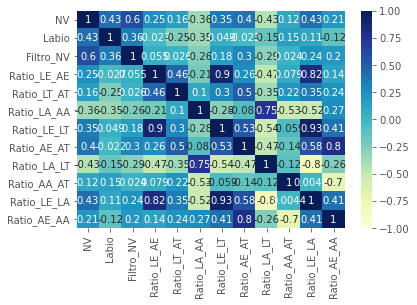

In [18]:
#variables originales del dataset
sns.heatmap(data.iloc[8:,8:].corr(), vmin = -1, vmax = 1, center = 0, cmap = "YlGnBu", annot = True)

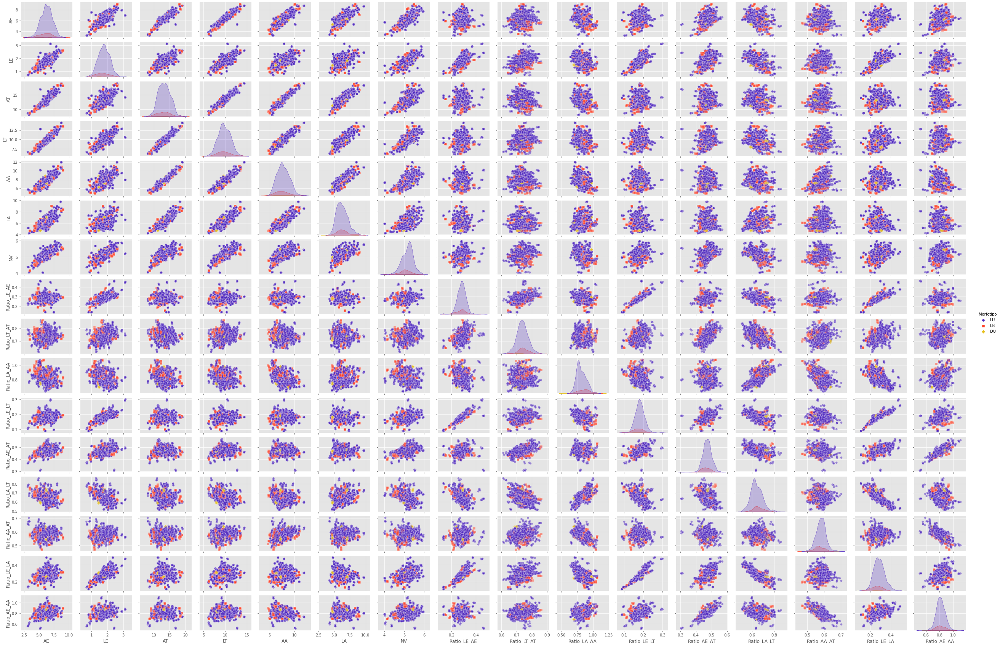

In [19]:
sns.pairplot(data=data,x_vars=['AE','LE','AT','LT','AA','LA','NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA'],\
        y_vars=['AE','LE','AT','LT','AA','LA','NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA'],\
         hue='Morfotipo',plot_kws={'alpha': 0.5},aspect=1.5, markers=['o','s','D'],palette='CMRmap', height=1.5);

C:\Users\msaied\Anaconda3\envs\ds\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


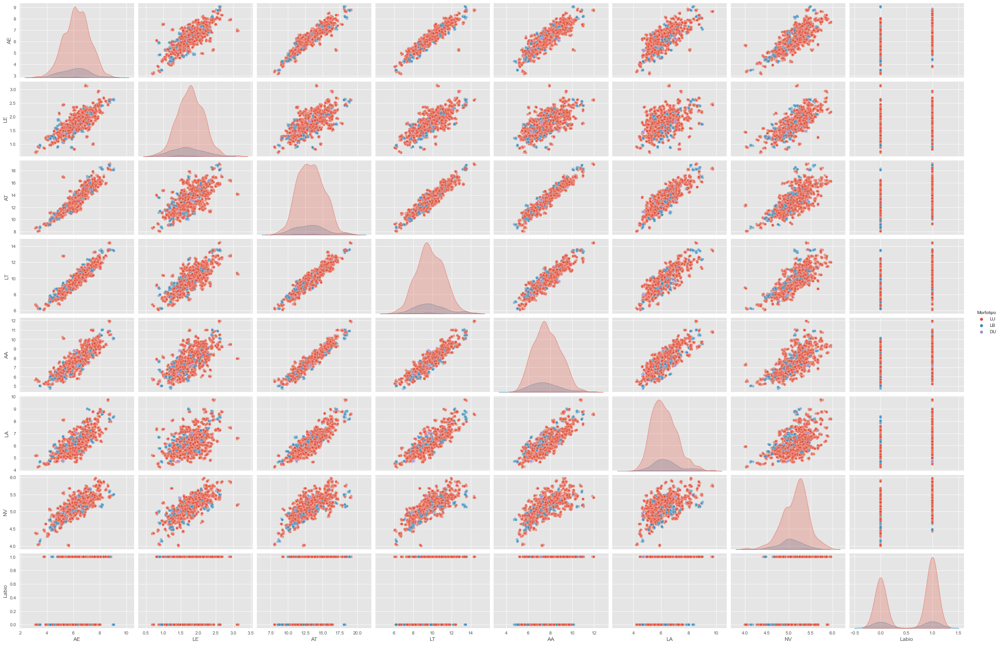

In [139]:
sns.pairplot(data=data,x_vars=['AE','LE','AT','LT','AA','LA','NV','Labio'],\
         y_vars=['AE','LE','AT','LT','AA','LA','NV','Labio'],hue='Morfotipo',plot_kws={'alpha': 0.5},aspect=1.5);

C:\Users\msaied\Anaconda3\envs\ds\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


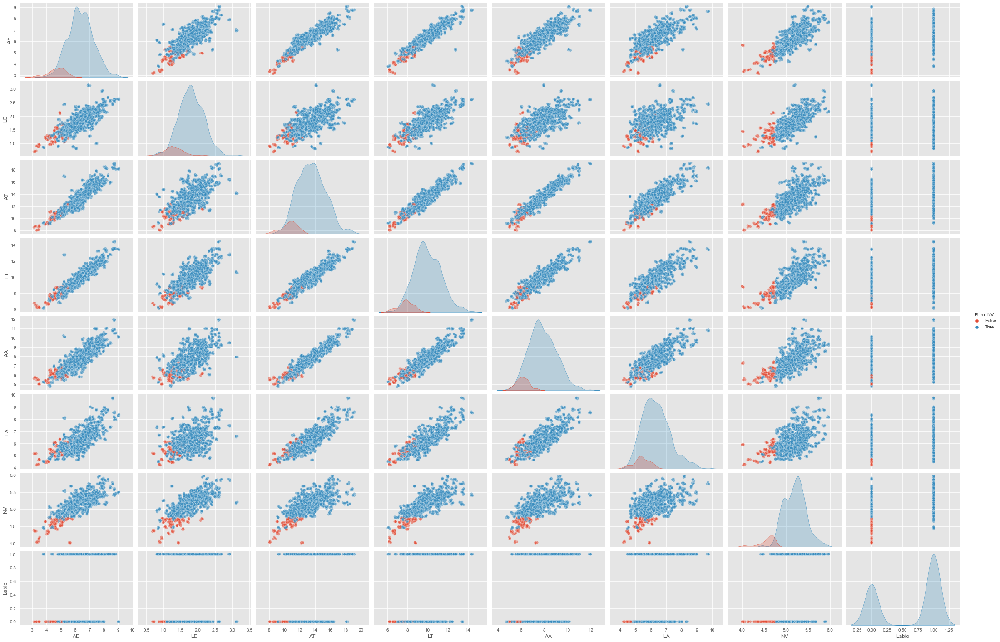

In [140]:
sns.pairplot(data=data,x_vars=['AE','LE','AT','LT','AA','LA','NV','Labio'],\
         y_vars=['AE','LE','AT','LT','AA','LA','NV','Labio'],hue='Filtro_NV',plot_kws={'alpha': 0.5},aspect=1.5);

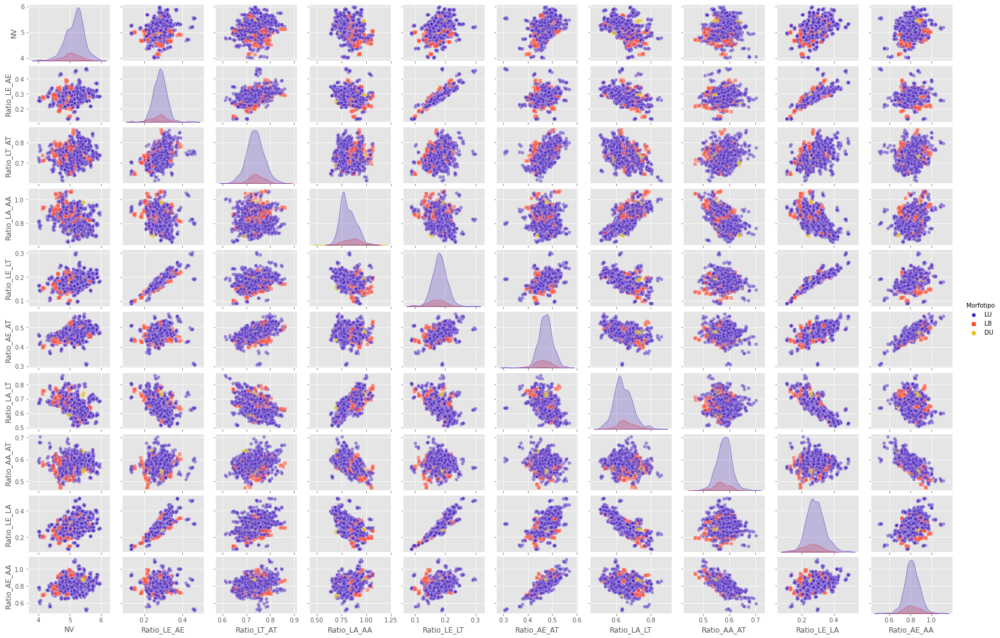

In [20]:
sns.pairplot(data=data,x_vars=['NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA'],\
     y_vars=['NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA'],\
        hue='Morfotipo',plot_kws={'alpha': 0.5},aspect=1.5, markers=['o','s','D'],palette='CMRmap', height=1.5);

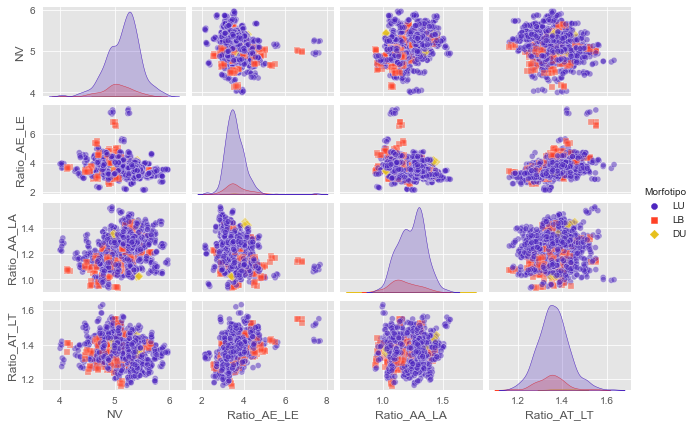

In [142]:
sns.pairplot(data=data,x_vars=['NV','Ratio_AE_LE','Ratio_AA_LA','Ratio_AT_LT'],\
         y_vars=['NV','Ratio_AE_LE','Ratio_AA_LA','Ratio_AT_LT'],\
             hue='Morfotipo',plot_kws={'alpha': 0.5},aspect=1.5, markers=['o','s','D'],palette='CMRmap', height=1.5);

### Distribución de las observaciones

In [22]:
def distribution_plotter(data, label, bins="auto"):    
    plt.figure(figsize = (10,5))
    sns.set_style("white")    
    dist = sns.histplot(data, bins=bins, stat = "count", kde = False, 
                        line_kws = {'linewidth':5}, 
                        binwidth = 500)    
    dist.set_title('Distribucion ', fontsize = 16)
    plt.xticks(rotation=45, ha='right')

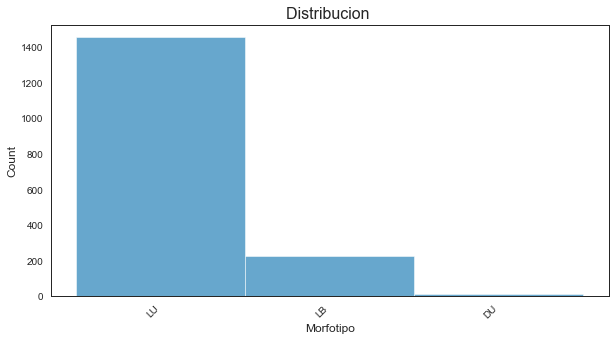

In [23]:
distribution_plotter(data["Morfotipo"],data["Morfotipo"].unique())

In [24]:
def draw_histograms(df, variables, n_rows, n_cols):
    fig=plt.figure(figsize=(15, 9))
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        df[var_name].hist(bins=10,ax=ax)
        ax.set_title(var_name+" Distribution")
    fig.tight_layout()  
    plt.show()

In [146]:
#draw_histograms(data, data[['AE','LE','AT','LT','AA','LA','NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA']], 4, 4)

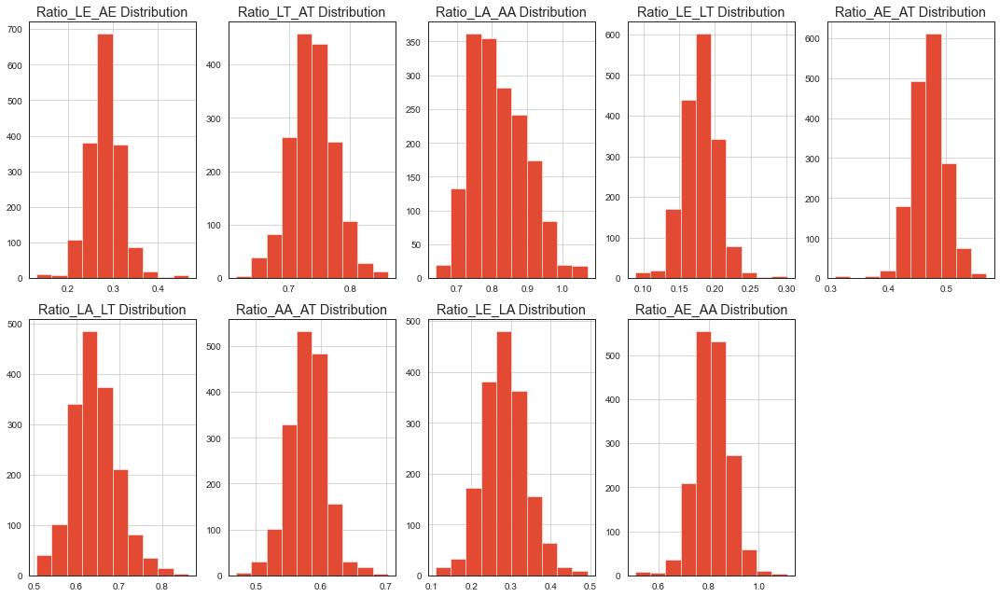

In [25]:
draw_histograms(data, data[['Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA']], 2, 5)

# Modelos de clustering

## Importación modulos y dataset

In [27]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report,confusion_matrix
from scipy.cluster import hierarchy 
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

## Prueba Kmeans

### Con las variables originales

In [28]:
from sklearn.metrics import silhouette_score,calinski_harabasz_score,classification_report,confusion_matrix
from sklearn.metrics import silhouette_score,silhouette_samples
import matplotlib.cm as cm


In [66]:
x = data[['AE','LE','AT','LT','AA','LA','NV']]
y_true = data["Morfotipo"]

scaler = StandardScaler()
x_scaled=scaler.fit_transform(x);

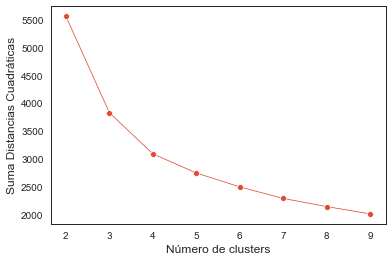

In [67]:
sq_distances=[]
k_values=range(2,10);

for k in k_values:
    kmeans=KMeans(n_clusters=k,n_init=10,random_state=0) # Numero de repeticiones=10
    kmeans.fit(x_scaled)
    sq_distances.append(kmeans.inertia_)

sns.lineplot(x=k_values,y=sq_distances,marker='o',size=30,legend=False);
plt.ylabel('Suma Distancias Cuadráticas');plt.xlabel('Número de clusters'); 

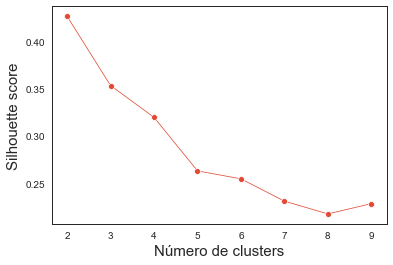

In [68]:
sil=[]
k_values=range(2,10);

for k in k_values:
    kmeans=KMeans(n_clusters=k,n_init=10,random_state=0) # Numero de repeticiones=10
    kmeans.fit(x_scaled)
    score=silhouette_score(x_scaled,kmeans.labels_)
    sil.append(score)

sns.lineplot(x=k_values,y=sil,marker='o',size=30,legend=False);
plt.ylabel('Silhouette score',fontsize=15);plt.xlabel('Número de clusters',fontsize=15);

For n_clusters = 2 The average silhouette_score is : 0.42639692009256586
For n_clusters = 3 The average silhouette_score is : 0.35332503785370095
For n_clusters = 4 The average silhouette_score is : 0.31977224062420867
For n_clusters = 5 The average silhouette_score is : 0.26291378533165505
For n_clusters = 6 The average silhouette_score is : 0.2557210062386755
For n_clusters = 7 The average silhouette_score is : 0.23163427184551913
For n_clusters = 8 The average silhouette_score is : 0.2175185539672478
For n_clusters = 9 The average silhouette_score is : 0.23045580738910224


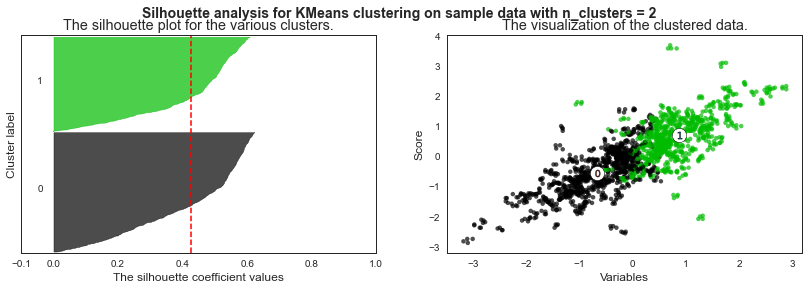

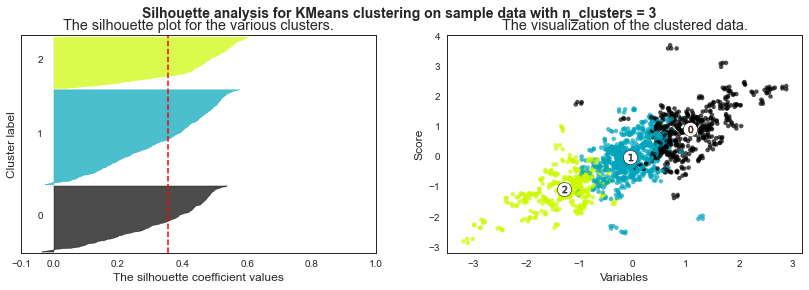

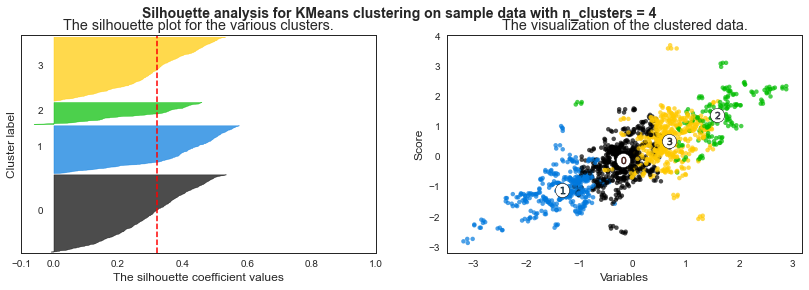

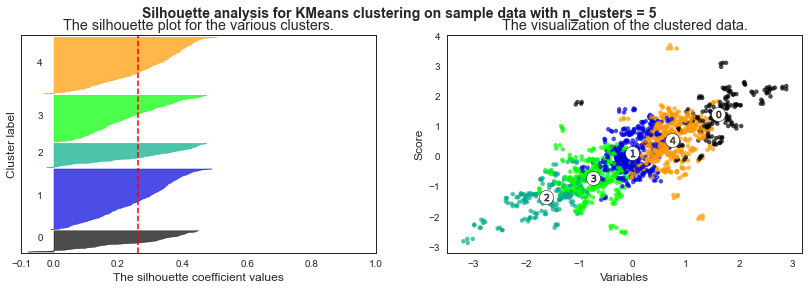

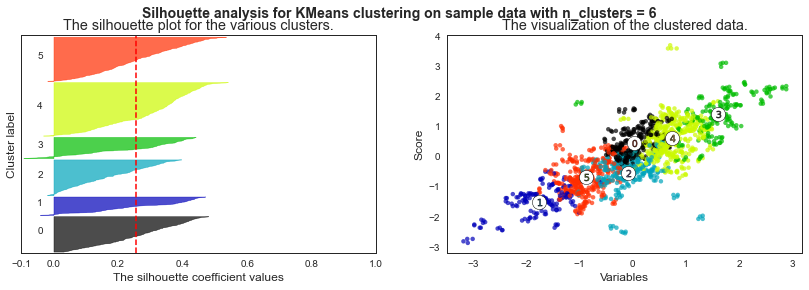

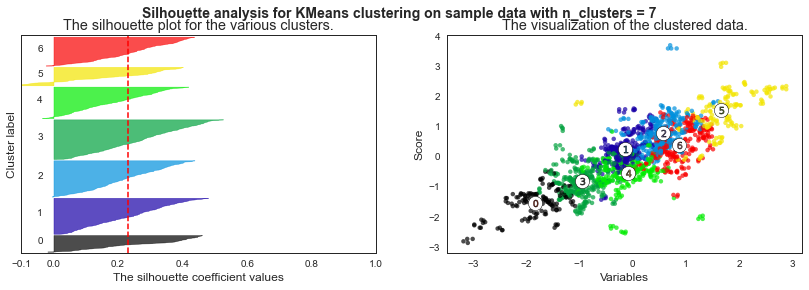

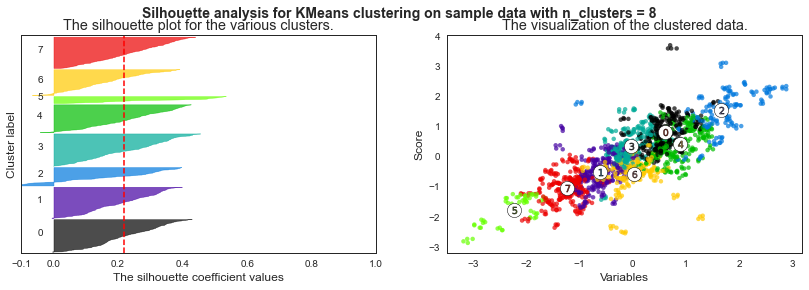

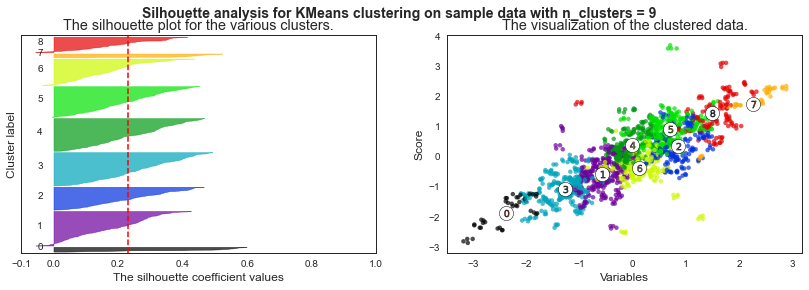

In [84]:
for n_clusters in range(2,10):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(14, 4)
    
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(x) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(x_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(x_scaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(x_scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(x_scaled[:, 0], x_scaled[:, 1], marker='.', s=80, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Variables")
    ax2.set_ylabel("Score")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

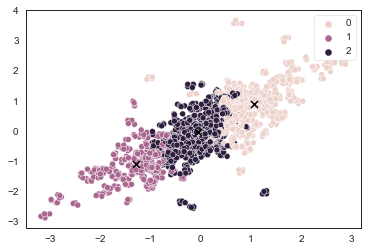

In [85]:
kmeans=KMeans(n_clusters=3,n_init=10,random_state=0) # Numero de repeticiones=10

kmeans.fit(x_scaled)

labels = kmeans.labels_ # Etiquetas que indican a qué cluster pertenecen los datos
centroids = kmeans.cluster_centers_ # Coordenadas de los centroides

sns.scatterplot(x=x_scaled[:,0],y=x_scaled[:,1],hue=labels,legend='full');

#plt.xlabel('Income',fontsize=15);plt.ylabel('Spending Score',fontsize=15);
plt.scatter(centroids[:,0],centroids[:,1],marker='x',s=50,color='k');

Text(0.5, 1.0, 'Kmeans')

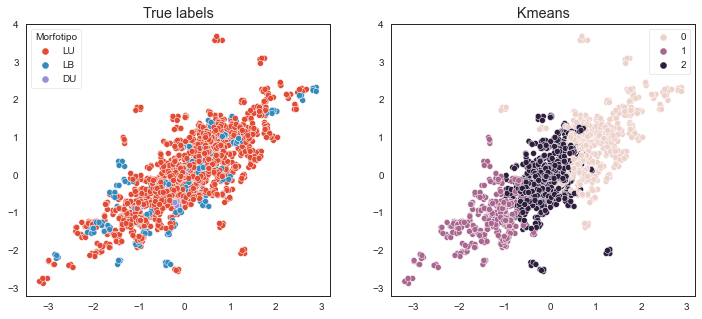

In [86]:
f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = x_scaled[:,0], y = x_scaled[:,1],hue=y_true,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = x_scaled[:,0], y = x_scaled[:,1],hue=labels,ax=ax[1])
ax[1].set_title('Kmeans')

Text(0.5, 1.0, 'Kmeans')

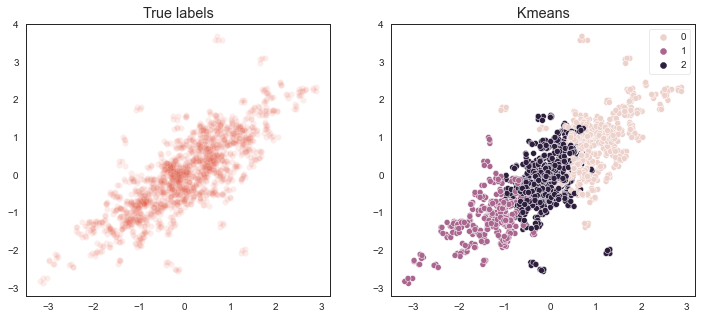

In [87]:
f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = x_scaled[:,0], y = x_scaled[:,1],ax=ax[0], alpha=0.1)
#sns.scatterplot(x = x_scaled[indices,0], y = x_scaled[indices,1],hue=y_true[y_true!="0"],ax=ax[0], palette="magma")
ax[0].set_title('True labels')
sns.scatterplot(x = x_scaled[:,0], y = x_scaled[:,1],hue=labels,ax=ax[1])
ax[1].set_title('Kmeans')

In [88]:
#sns.heatmap(confusion_matrix(y_true,labels),annot=True,cmap='Blues',fmt=".0f");

#print(classification_report(y_true,labels))

### Con todas las variables (menos Labio y Filtro_NV)

In [ ]:
#x_R = data[['AE','LE','AT','LT','AA','LA','NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA']]
##x_R = data[['NV','Ratio_AE_LE','Ratio_AA_LA','Ratio_AT_LT']]
#y_true = data["Morfotipo"]

#scaler = StandardScaler()
#x_R_scaled=scaler.fit_transform(x_R);

In [73]:
x_R = data[['AE','LE','AT','LT','AA','LA','NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA']]
#x_R = data[['NV','Ratio_AE_LE','Ratio_AA_LA','Ratio_AT_LT']]
y_true = data["Morfotipo"]

scaler = StandardScaler()
x_R_scaled=scaler.fit_transform(x_R);

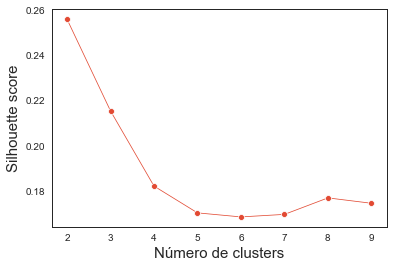

In [76]:
sil=[]
k_values=range(2,10);

for k in k_values:
    kmeans=KMeans(n_clusters=k,n_init=10,random_state=0) # Numero de repeticiones=10
    kmeans.fit(x_R_scaled)
    score=silhouette_score(x_R_scaled,kmeans.labels_)
    sil.append(score)

sns.lineplot(x=k_values,y=sil,marker='o',size=30,legend=False);
plt.ylabel('Silhouette score',fontsize=15);plt.xlabel('Número de clusters',fontsize=15);

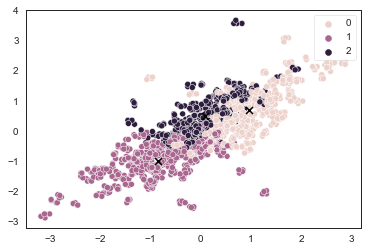

In [77]:
kmeans=KMeans(n_clusters=3,n_init=10,random_state=0) # Numero de repeticiones=10

kmeans.fit(x_R_scaled)

labels_R = kmeans.labels_ # Etiquetas que indican a qué cluster pertenecen los datos
centroids_R = kmeans.cluster_centers_ # Coordenadas de los centroides

sns.scatterplot(x=x_R_scaled[:,0],y=x_R_scaled[:,1],hue=labels_R,legend='full');

#plt.xlabel('Income',fontsize=15);plt.ylabel('Spending Score',fontsize=15);
plt.scatter(centroids_R[:,0],centroids_R[:,1],marker='x',s=50,color='k');

Text(0.5, 1.0, 'Kmeans_R')

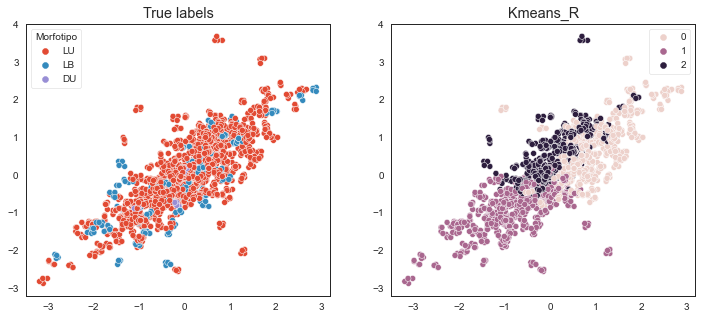

In [78]:
f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = x_R_scaled[:,0], y = x_R_scaled[:,1],hue=y_true,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = x_R_scaled[:,0], y = x_R_scaled[:,1],hue=labels_R,ax=ax[1])
ax[1].set_title('Kmeans_R')

## DBSCAN

In [33]:
from scipy.spatial.distance import pdist,squareform

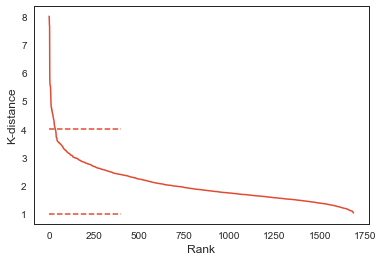

In [79]:
minPts=20;
k=minPts-1;

D=squareform(pdist(x_R_scaled));

k_distances=np.zeros(D.shape[0]);

for i in range(D.shape[0]):
    distances=np.sort(D[i]);
    k_distances[i]=distances[k];
k_distances=np.sort(k_distances);
k_distances=k_distances[::-1];
    
plt.plot(k_distances);
plt.xlabel('Rank');
plt.ylabel('K-distance');
plt.hlines([1,4],0,400,linestyles='dashed');

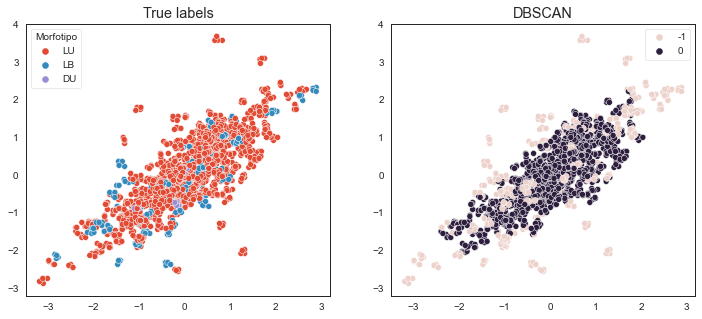

In [80]:
dbscan = DBSCAN(eps=2, min_samples=minPts)
labels_db = dbscan.fit_predict(x_R_scaled)

f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = x_R_scaled[:,0], y = x_R_scaled[:,1],hue=y_true,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = x_R_scaled[:,0], y = x_R_scaled[:,1],hue=labels_db,ax=ax[1])
ax[1].set_title('DBSCAN');

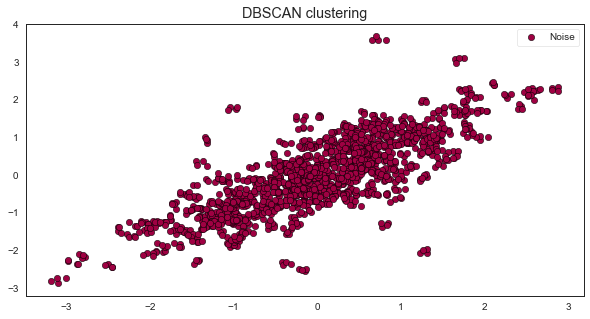

In [81]:
# Implementación de DBSCAN

dbscan = DBSCAN(eps=0.2, min_samples=5)
y_dbscan = dbscan.fit_predict(x_R_scaled)
y_dbscan


labels = dbscan.labels_
unique_labels=set(labels);

fig, ax = plt.subplots(figsize=(10,5))

colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

for i,l in enumerate(unique_labels):
    if l ==-1:
        ax.scatter(x_R_scaled[labels==l,0], x_R_scaled[labels==l,1],color =colors[i], edgecolor='black', marker='o',s=40,label='Noise')
    else:
        ax.scatter(x_R_scaled[labels==l,0], x_R_scaled[labels==l,1],color =colors[i], edgecolor='black', marker='o',s=40,label='Cluster '+str(l))
    
ax.legend()
ax.set_title('DBSCAN clustering');
    

# Modelos reducción dimensionalidad

## Prueba PCA

In [38]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [ ]:
#std_sclr = StandardScaler()

#X = data[['AE','LE','AT','LT','AA','LA','NV','Filtro_NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA']]

#data_std = pd.DataFrame(std_sclr.fit_transform(X))

In [39]:
std_sclr = StandardScaler()

X = data[['AE','LE','AT','LT','AA','LA','NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA']]

data_std = pd.DataFrame(std_sclr.fit_transform(X))

In [40]:
model = PCA()

In [41]:
model_pca = model.fit(data_std)

### Pesos (loadings)

In [42]:
#Creamos un DataFrame con los loadings.
pca_loadings = pd.DataFrame(model_pca.components_.T, index=X.columns).iloc[:,:]
pca_loadings.rename(columns = {0 : 'CP1', 1 : 'CP2', 2 : 'CP3', 3 : 'CP4',4 : 'CP5', 5 : 'CP6', 6 : 'CP7', 7 : 'CP8',8 : 'CP9', 9 : 'CP10', 10 : 'CP11'}, inplace = True)
pca_loadings

,CP1,CP2,CP3,CP4,CP5,CP6,CP7,CP8,CP9,CP10,CP11,11,12,13,14,15
AE,-0.343931,-0.161026,-0.166818,0.116139,-0.080007,-0.076238,0.182561,0.220374,-0.184102,-0.057332,-0.191576,-0.329036,0.625801,-0.146160,0.046214,-0.350839
LE,-0.368367,0.069743,-0.022360,-0.123243,0.189383,-0.024075,0.105903,0.559284,-0.442797,-0.095263,0.216900,0.260018,-0.323052,-0.098124,0.217617,0.046327
AT,-0.301072,-0.292215,-0.072285,0.103888,0.106915,0.117621,0.109976,-0.109330,0.095077,0.155710,-0.042286,-0.058403,0.181599,0.128580,0.323839,0.752176
LT,-0.335598,-0.216741,-0.077606,-0.087776,-0.047290,0.240853,0.099735,0.034849,-0.034359,0.014778,0.148420,-0.102494,-0.119537,0.240018,-0.801853,0.080403
AA,-0.298626,-0.305160,0.089552,0.013146,0.002831,-0.029392,0.130195,-0.220660,0.091225,0.520879,-0.140375,-0.132967,-0.462470,0.011452,0.223696,-0.402396
LA,-0.210755,-0.357081,-0.204772,-0.261169,0.074039,-0.042829,0.085850,-0.285118,0.331564,-0.526107,0.055734,0.409821,0.007095,-0.171279,0.078948,-0.168980
NV,-0.324399,-0.066226,-0.073049,0.048278,-0.090358,-0.154729,-0.922000,0.007624,-0.008323,0.012128,-0.013674,-0.006422,0.003877,0.002080,-0.001108,0.000150
Ratio_LE_AE,-0.189387,0.303883,0.158098,-0.346805,0.411317,0.074737,-0.043542,-0.452333,-0.180500,0.125692,0.424675,-0.190910,0.233493,-0.147181,0.021214,-0.058688
Ratio_LT_AT,-0.105297,0.223260,-0.009092,-0.589848,-0.475948,0.381300,-0.024372,0.093285,0.101846,-0.054139,-0.113439,-0.119801,0.023657,0.309695,0.266856,-0.040557
Ratio_LA_AA,0.192214,-0.027134,-0.474044,-0.430658,0.125519,0.021511,-0.057221,0.099928,-0.018879,0.365507,-0.322305,0.047685,-0.008127,-0.480480,-0.169447,0.151362


In [43]:
pca_loadings.T.dot(pca_loadings)

,CP1,CP2,CP3,CP4,CP5,CP6,CP7,CP8,CP9,CP10,CP11,11,12,13,14,15
CP1,1.000000e+00,1.114350e-16,1.019332e-17,-6.952435e-17,2.236727e-17,-3.040873e-17,2.622365e-17,2.380167e-17,-1.051232e-16,-4.394452e-17,9.237907e-18,7.191691e-17,-1.797518e-16,-6.771303e-17,-2.084800e-17,-1.503522e-16
CP2,1.114350e-16,1.000000e+00,2.614433e-16,-6.134431e-17,-1.138825e-16,-4.489634e-17,1.582321e-16,7.186492e-18,2.989318e-17,-7.242085e-17,2.968042e-17,5.465265e-17,-7.955052e-17,6.963362e-17,-1.944652e-16,1.041561e-16
CP3,1.019332e-17,2.614433e-16,1.000000e+00,4.045471e-18,1.587374e-16,1.715942e-16,-2.702116e-16,4.442807e-17,-4.392172e-17,-8.029397e-17,2.680966e-17,-7.430043e-18,1.825301e-16,-6.947028e-17,2.011269e-16,1.189766e-16
CP4,-6.952435e-17,-6.134431e-17,4.045471e-18,1.000000e+00,-3.652304e-16,4.925495e-16,-1.900040e-16,1.892432e-16,-3.684028e-17,2.273968e-16,1.098267e-17,-1.413835e-16,-3.762479e-17,2.169095e-16,-1.730412e-16,1.473699e-17
CP5,2.236727e-17,-1.138825e-16,1.587374e-16,-3.652304e-16,1.000000e+00,-1.613509e-16,1.320627e-16,-1.729397e-16,2.233216e-16,-3.840304e-17,-5.159066e-17,5.747819e-17,-3.499817e-17,-1.202970e-16,1.991696e-16,-7.555299e-17
CP6,-3.040873e-17,-4.489634e-17,1.715942e-16,4.925495e-16,-1.613509e-16,1.000000e+00,-3.363302e-16,-2.202802e-16,-7.784450e-17,2.009997e-16,2.428240e-17,-9.089800e-17,-3.777925e-17,9.315092e-18,2.031974e-16,-1.755446e-16
CP7,2.622365e-17,1.582321e-16,-2.702116e-16,-1.900040e-16,1.320627e-16,-3.363302e-16,1.000000e+00,-2.324362e-16,1.104423e-16,-8.689163e-17,2.496739e-19,5.354871e-17,-3.697048e-17,-1.101187e-16,1.688435e-17,-4.815560e-17
CP8,2.380167e-17,7.186492e-18,4.442807e-17,1.892432e-16,-1.729397e-16,-2.202802e-16,-2.324362e-16,1.000000e+00,2.816895e-17,1.232372e-16,3.579975e-16,6.047618e-17,1.066623e-16,3.393636e-17,2.899402e-16,-3.274603e-17
CP9,-1.051232e-16,2.989318e-17,-4.392172e-17,-3.684028e-17,2.233216e-16,-7.784450e-17,1.104423e-16,2.816895e-17,1.000000e+00,1.599488e-18,1.494115e-16,1.356950e-17,-2.123299e-16,-2.083108e-16,2.017474e-17,-5.125571e-17
CP10,-4.394452e-17,-7.242085e-17,-8.029397e-17,2.273968e-16,-3.840304e-17,2.009997e-16,-8.689163e-17,1.232372e-16,1.599488e-18,1.000000e+00,-3.811534e-16,-2.487967e-17,1.412026e-16,2.251978e-17,-1.344533e-16,9.222422e-17


In [44]:
def plot_explained_variance(components_count, X):

    model_pca = PCA(components_count).fit(X)

    explained_variance = model_pca.explained_variance_ratio_

    #print(explained_variance)

    cumulative_explained_variance = np.cumsum(explained_variance)

    #print(cumulative_explained_variance)

    plt.plot(cumulative_explained_variance)
    plt.xlabel('número de componentes')
    plt.ylabel('% de varianza explicada');

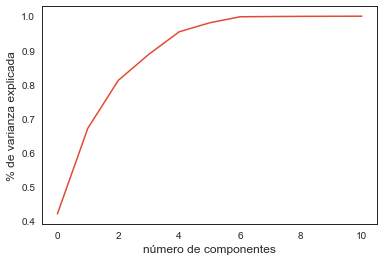

In [45]:
plot_explained_variance(components_count = 11, X = data_std)

### Proyección

In [46]:
#nuevo dataset con cada participación de feature
#nuevo_data_pca = pd.DataFrame(model_pca.fit_transform(data_std), index =X.index,\
     #                         columns=['PC1', 'PC2', 'PC3', 'PC4','PC5', 'PC6', 'PC7', 'PC8','PC9', 'PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17'])

In [48]:
#nuevo dataset con cada participación de feature
nuevo_data_pca = pd.DataFrame(model_pca.fit_transform(data_std), index =X.index,\
                              columns=['PC1', 'PC2', 'PC3', 'PC4','PC5', 'PC6', 'PC7', 'PC8','PC9', 'PC10','PC11','PC12','PC13','PC14','PC15','PC16'])

In [49]:
nuevo_data_pca.head(10)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16
0,-1.505085,0.220738,0.679953,-1.910266,2.516699,0.378866,-0.445062,-0.037378,-0.057760,-0.058923,0.064835,-0.000463,0.001649,-0.018943,0.011667,-0.002875
1,2.476477,0.699812,-1.873102,0.253761,0.264604,-0.742140,-0.026588,-0.037582,-0.050649,0.046456,0.020469,-0.007308,-0.036344,0.008412,-0.014059,0.013624
2,-0.273530,-0.585355,1.739736,0.448664,0.345189,0.364495,0.054053,-0.035961,-0.015969,-0.003718,-0.018138,0.012328,-0.007810,-0.007323,-0.004397,-0.000080
3,-3.026347,5.828376,-1.022636,0.995469,-0.887463,-0.531105,-0.123592,0.054991,0.365245,0.045448,0.090634,0.071504,-0.016939,0.055248,0.014002,-0.009570
4,-1.641426,0.093987,1.183441,-2.307903,2.203849,0.012784,-0.393134,-0.060914,-0.061434,-0.039857,0.073961,0.018392,0.000918,-0.009535,0.012830,-0.018814
5,-1.332946,-0.006016,0.692523,-2.019733,2.817842,0.050004,-0.579509,-0.058511,-0.063419,-0.057146,0.060663,-0.000351,0.005881,-0.013746,0.016657,-0.005007
6,-1.658628,0.257403,0.783805,-2.018431,2.091335,-0.108017,-0.465664,-0.037502,-0.062075,-0.049183,0.046946,0.011942,-0.004313,-0.008109,0.012342,-0.011027
7,2.306022,0.752875,-2.035086,0.419491,-0.339290,-0.670615,0.061357,-0.062853,-0.064033,0.046369,0.041522,0.006145,-0.039796,-0.000803,-0.004805,0.015423
8,2.255754,0.491230,-1.571544,0.276623,-0.600029,-0.749375,-0.089629,-0.054688,-0.059538,0.023777,0.042454,-0.010711,-0.043154,-0.005754,-0.002477,0.020389
9,2.344091,0.682761,-1.423822,0.120573,-0.003197,-0.825189,-0.054243,-0.044751,-0.050026,0.024661,0.023149,-0.018234,-0.039932,0.006684,-0.011243,0.018550


In [50]:
nuevo_data_pca.shape

(1688, 16)

In [51]:
model_pca.explained_variance_ratio_

array([4.20808457e-01, 2.50865300e-01, 1.39981434e-01, 7.61111046e-02,
       6.60881100e-02, 2.63373691e-02, 1.76705213e-02, 7.57059880e-04,
       4.76784509e-04, 2.69029212e-04, 2.06083679e-04, 1.62448633e-04,
       1.19672137e-04, 7.34253008e-05, 4.10874436e-05, 3.21131367e-05])

### Bastón quebrado

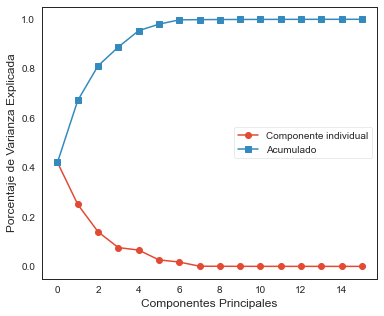

In [52]:
plt.figure(figsize=(6,5))

plt.plot(model_pca.explained_variance_ratio_, '-o', label='Componente individual')
plt.plot(np.cumsum(model_pca.explained_variance_ratio_), '-s', label='Acumulado')

plt.ylabel('Porcentaje de Varianza Explicada'); plt.xlabel('Componentes Principales')
plt.ylim(-0.05,1.05); plt.xticks()
plt.legend(loc=0);

## Prueba TSNE

In [53]:
from sklearn.manifold import TSNE

In [54]:
tsne = TSNE(random_state=42)

proj_tsne = tsne.fit_transform(data_std)

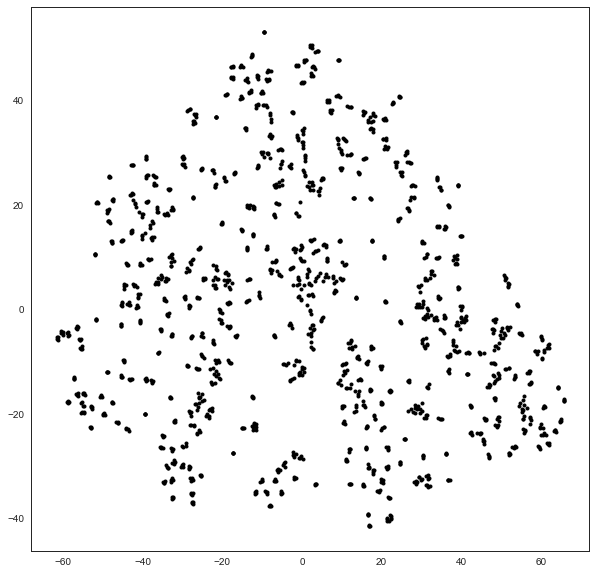

In [55]:
fig, ax = plt.subplots(figsize=(10, 10))

# get axis from plot -  https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.gca.html
ax = ax or plt.gca()
    
coord_x = proj_tsne[:, 0]
coord_y = proj_tsne[:, 1]
ax.plot(coord_x, coord_y, '.k')    

# Modelos clasificación

## CART con oversampling

In [56]:
from sklearn.model_selection import train_test_split

In [163]:
#newX = data[['AE','LE','AT','LT','AA','LA','NV','Labio','Filtro_NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA']]
#newy = data['Morfotipo']

In [57]:
newX = data[['AE','LE','AT','LT','AA','LA','NV','Labio','Filtro_NV','Ratio_LE_AE','Ratio_LT_AT','Ratio_LA_AA','Ratio_LE_LT','Ratio_AE_AT','Ratio_LA_LT','Ratio_AA_AT','Ratio_LE_LA','Ratio_AE_AA']]
newy = data['Morfotipo']

In [58]:
X_train, X_test, y_train, y_test = train_test_split(newX,newy,stratify = data['Morfotipo'],random_state=0)

In [59]:
# chequeamos la presencia relativa de cada clase y el tamaño de los datasets
print('Entrenamiento:',X_train.shape)
print('Testeo:',X_test.shape)
print('\nClases train:')
print(y_train.value_counts(normalize=True))
print('\nClases test:')
print(y_test.value_counts(normalize=True))

Entrenamiento: (1266, 18)
Testeo: (422, 18)

Clases train:
LU    0.860190
LB    0.132701
DU    0.007109
Name: Morfotipo, dtype: float64

Clases test:
LU    0.860190
LB    0.132701
DU    0.007109
Name: Morfotipo, dtype: float64


### OverSampling

In [60]:
from imblearn.over_sampling import RandomOverSampler

oversampler=RandomOverSampler(sampling_strategy='minority');

X_train_os,y_train_os=oversampler.fit_resample(X_train,y_train);

print('Composición del training set:')
print(y_train_os.value_counts())

print('\nComposición del test set:')
print(y_test.value_counts())

Composición del training set:
DU    1089
LU    1089
LB     168
Name: Morfotipo, dtype: int64

Composición del test set:
LU    363
LB     56
DU      3
Name: Morfotipo, dtype: int64


In [61]:
X_train_os2,y_train_os2=oversampler.fit_resample(X_train_os,y_train_os);

print('Composición del training set:')
print(y_train_os2.value_counts())

print('\nComposición del test set:')
print(y_test.value_counts())

Composición del training set:
LB    1089
DU    1089
LU    1089
Name: Morfotipo, dtype: int64

Composición del test set:
LU    363
LB     56
DU      3
Name: Morfotipo, dtype: int64


## CART

In [62]:
from sklearn.tree import DecisionTreeClassifier # to build a classification tree
from sklearn.tree import plot_tree # to draw a classification tree
from sklearn.metrics import plot_confusion_matrix # to draw a confusion matrix

In [63]:
clf_dt = DecisionTreeClassifier(max_depth = 7, random_state=42)
clf_dt = clf_dt.fit(X_train_os2,y_train_os2)

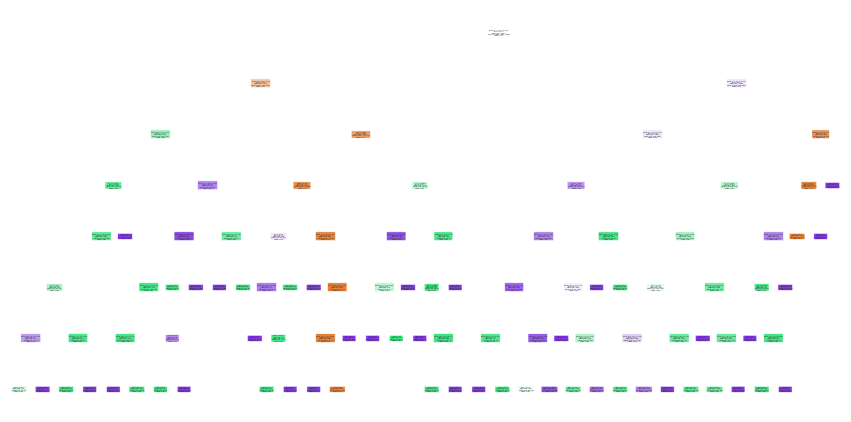

In [64]:
plt.figure(figsize=(15, 7.5))
plot_tree(clf_dt, 
          filled=True, 
          rounded=True, 
          class_names=["LU","DU", "LB"], 
          feature_names=X_train_os2.columns); 

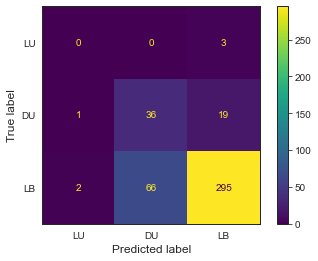

In [65]:
plot_confusion_matrix(clf_dt, X_test, y_test, display_labels=["LU","DU","LB"])